In [1]:
import json
import os
import glob
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import pickle as pkl

In [1]:
# import open3d as o3d
import numpy as np
import cv2
import torch
import pandas as pd
import re
import pickle as pkl
import json
import glob
import shutil
import os
import json
import pathlib as pl
from tqdm import trange, tqdm
from glob import glob
from collections import Counter
from sklearn.model_selection import train_test_split
from scipy.spatial.transform import Rotation as R

def get_json_data(json_file_path):
    dp = pd.DataFrame(columns=["class", "position x", "position y", "position z", "rotation", "scale l", "scale w", "scale h", "file_name"])
    for file in tqdm(label_list_3d):
        with open(file, 'r') as f:
            json_data = json.load(f)
            for i in range(len(json_data)):
                row = [json_data[i]["obj_type"], json_data[i]["psr"]["position"]["x"], json_data[i]["psr"]["position"]["y"], json_data[i]["psr"]["position"]["z"], json_data[i]["psr"]["rotation"]['z'], json_data[i]["psr"]["scale"]["x"], json_data[i]["psr"]["scale"]["y"], json_data[i]["psr"]["scale"]["z"], file.split("/")[-1].split(".")[0]]
                frame_data = pd.DataFrame([row], columns=["class", "position x", "position y", "position z", "rotation", "scale l", "scale w", "scale h", "file_name"])
                dp = pd.concat([dp, frame_data], axis=0)

    # make the dp's index to descending order
    dp = dp.reset_index(drop=True)
    return dp


data_path = "/data/NIA50/50-2/data/NIA50/nia50_all/raw"
label_list_3d = pl.Path(data_path).glob("*/label/*.json")
label_list_3d = sorted([str(label) for label in label_list_3d])

dp = get_json_data(label_list_3d)

dp.head(5)

In [17]:
dp

,class,position x,position y,position z,rotation,scale l,scale w,scale h,file_name
0,Car,-17.355507,-36.689805,-10.645174,-0.234196,4.548734,1.654719,1.487743,0.0
1,Car,-8.518801,-40.210445,-11.052931,-0.255028,2.061348,0.392235,0.752132,1.0
2,Bus,-29.224326,-33.753900,-8.852093,-0.938424,10.788748,2.479926,3.375624,2.0
3,Bus,-22.829048,-42.785682,-9.452041,-0.956274,10.735777,2.451729,3.166890,3.0
4,SUV,-28.442108,-26.932586,-9.924473,-0.929091,2.956965,0.176704,0.980386,4.0
...,...,...,...,...,...,...,...,...,...
33395,SUV,9.727513,-45.575410,-12.340306,-2.057428,3.548757,1.534856,1.709523,5.0
33396,Car,7.474199,-27.471178,-12.468245,-2.158009,4.572125,1.597697,1.240376,6.0
33397,Large_Truck,26.268257,-12.952444,-13.313128,-1.996366,5.820206,1.729038,2.642812,7.0
33398,Large_Truck,23.639190,-18.930878,-13.126253,-1.996718,5.262523,1.759877,2.622406,8.0


In [16]:
import pathlib as pl
data_path = "/data/NIA50/50-2/data/NIA50/nia50_all/raw"

label_list_3d = pl.Path(data_path).glob("*/label/*.json")
len([i for i in label_list_3d])

33400

In [1]:
dp.to_csv('/data/NIA50/kimgh/cls_data.csv')


KeyboardInterrupt



In [1]:
import pandas as pd

dp = pd.read_csv('/data/NIA50/kimgh/cls_data.csv', index_col=0)
dp = dp.dropna()
dp.iloc[:, 1:] = dp.iloc[:, 1:].astype('float')

In [5]:
dp.groupby('class').count()

,position x,position y,position z,rotation,scale l,scale w,scale h,file_name
class,,,,,,,,
0,22,22,22,22,22,22,22,22
Adult,7667,7667,7667,7667,7667,7667,7667,7667
Bus,1428,1428,1428,1428,1428,1428,1428,1428
Car,11979,11979,11979,11979,11979,11979,11979,11979
Kickboard,755,755,755,755,755,755,755,755
Kid,50,50,50,50,50,50,50,50
Large_Truck,119,119,119,119,119,119,119,119
Light_Car,455,455,455,455,455,455,455,455
Medium_Truck,1011,1011,1011,1011,1011,1011,1011,1011


In [14]:
dp.loc[dp['class']=='Light_Car', 'class'] = 'Car'
dp.loc[dp['class']=='Small_Car', 'class'] = 'Car'
dp.loc[dp['class']=='Small_Truck', 'class'] = 'Truck'
dp.loc[dp['class']=='Medium_Truck', 'class'] = 'Truck'
dp.loc[dp['class']=='Large_Truck', 'class'] = 'Truck'
dp.loc[dp['class']=='Adult', 'class'] = 'Person'
dp.loc[dp['class']=='Kid', 'class'] = 'Person'
dp.loc[dp['class']=='Kickboard', 'class'] = 'Two_Wheeler'
dp.loc[dp['class']=='Mini_Bus', 'class'] = 'Bus'

In [15]:
dp.groupby('class').quantile([0.9])[['scale l', 'scale w', 'scale h']].apply(lambda x : round(x, 2))

,,scale l,scale w,scale h
class,,,,
0,0.9,0.00,0.00,0.00
Bus,0.9,11.86,2.90,3.48
Car,0.9,4.69,1.80,1.56
Person,0.9,0.66,0.69,1.65
SUV,0.9,4.61,1.88,1.75
Special_Vehicle,0.9,9.43,2.83,3.74
Truck,0.9,6.08,2.13,2.80
Two_Wheeler,0.9,2.15,0.71,1.51
Unknown,0.9,4.42,1.61,1.36


In [3]:
len(os.listdir('/NIA50/50-2/result/deepfusionmot/data'))

591

In [19]:
with open('/data/NIA50/50-2/result/pvrcnn_integ/val_epoch5/eval/result.pkl','rb') as f:
    result = pkl.load(f)

result[10]

{'name': array(['Bus', 'Car', 'SUV_&_Van', 'SUV_&_Van', 'Car', 'Truck', 'Car',
        'Car', 'Truck', 'Car', 'Car', 'Truck', 'Car', 'Two_Wheeler', 'Car',
        'Person', 'Person', 'Person', 'Car', 'Car', 'Two_Wheeler',
        'Person', 'Car', 'Person', 'Car', 'Person', 'Two_Wheeler',
        'Two_Wheeler', 'Person', 'Person', 'Person', 'Car'], dtype='<U15'),
 'score': array([0.9194422 , 0.8523049 , 0.83542883, 0.8276885 , 0.8015887 ,
        0.72447413, 0.716129  , 0.7052833 , 0.6955303 , 0.66686386,
        0.65668046, 0.64514244, 0.61835945, 0.5916182 , 0.558596  ,
        0.5520324 , 0.5263026 , 0.5243737 , 0.49760187, 0.4524309 ,
        0.4170021 , 0.41440523, 0.4109147 , 0.3821711 , 0.3339132 ,
        0.2564147 , 0.2539288 , 0.23025897, 0.1456336 , 0.11688273,
        0.1155233 , 0.1139006 ], dtype=float32),
 'boxes_lidar': array([[-3.2615929e+01, -2.7709692e+01,  5.4573641e+00,  1.0850082e+01,
          2.4919033e+00,  3.3875842e+00,  5.3611436e+00],
        [ 1.0412935e+01

In [22]:
with open('/data/NIA50/50-2/data/nia50_final/pvrcnn_integ/custom_infos_val.pkl','rb') as f:
    val = pkl.load(f)

val

[{'point_cloud': {'num_features': 4,
   'lidar_idx': 'L_2210_Suwon_A_A_C0001_0000'},
  'annos': {'name': array(['Person', 'Person', 'Person', 'Person', 'Person', 'Person',
          'Person', 'Two_Wheeler', 'SUV_&_Van', 'Car', 'Car', 'Car', 'Car',
          'SUV_&_Van', 'Car', 'Car'], dtype='<U11'),
   'gt_boxes_lidar': array([[-11.147488  , -25.097582  ,   2.900866  ,   0.35303995,
             0.56471664,   1.1008978 ,  -2.2118583 ],
          [ -9.131391  , -26.735703  ,   2.9621787 ,   0.27293685,
             0.4640261 ,   1.0791922 ,  -2.0105355 ],
          [-11.174683  , -28.213541  ,   3.1661658 ,   0.33968014,
             0.3049738 ,   1.1467428 ,  -2.1644363 ],
          [ -6.957083  , -30.004578  ,   2.71987   ,   0.30861282,
             0.26068592,   1.151948  ,  -0.72602546],
          [ -6.489054  , -28.661407  ,   2.4777665 ,   0.31383973,
             0.12788174,   1.1180048 ,  -0.49680343],
          [ -4.7243986 , -26.378431  ,   2.5273318 ,   0.9833102 ,
         

In [11]:
import pickle as pkl

with open('/data/NIA50/50-2/kimgh/result.pkl', 'rb') as f:
    result = pkl.load(f)

result[0]

{'name': array(['Car', 'Car', 'Car', 'Car', 'Cyclist', 'Pedestrian', 'Car'],
       dtype='<U10'),
 'truncated': array([0., 0., 0., 0., 0., 0., 0.]),
 'occluded': array([0., 0., 0., 0., 0., 0., 0.]),
 'alpha': array([-4.515019 , -7.307989 , -4.2116895, -4.224042 , -8.128968 ,
        -6.3445325, -7.203786 ], dtype=float32),
 'bbox': array([[390.24335 , 182.20766 , 419.6205  , 201.81464 ],
        [761.1326  , 169.04703 , 854.93427 , 210.28743 ],
        [208.61067 , 185.43527 , 277.3452  , 216.95027 ],
        [243.72272 , 182.93022 , 300.17627 , 207.1049  ],
        [676.1753  , 166.7601  , 690.37445 , 194.47124 ],
        [824.6792  , 163.29904 , 844.5361  , 202.68619 ],
        [ 49.243084, 190.79102 , 145.7945  , 224.93127 ]], dtype=float32),
 'dimensions': array([[3.8637164 , 1.4901445 , 1.571226  ],
        [4.345063  , 1.557294  , 1.6751873 ],
        [4.019386  , 1.5663987 , 1.61738   ],
        [4.269479  , 1.5481825 , 1.7534101 ],
        [1.7806495 , 1.734358  , 0.4306398 ],

In [21]:
import pickle as pkl

with open('/data/NIA50/50-2/data/nia50_final/pvrcnn_integ/custom_infos_val.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

{'point_cloud': {'num_features': 4,
  'lidar_idx': 'L_2210_Suwon_A_A_C0001_0000'},
 'annos': {'name': array(['Person', 'Person', 'Person', 'Person', 'Person', 'Person',
         'Person', 'Two_Wheeler', 'SUV_&_Van', 'Car', 'Car', 'Car', 'Car',
         'SUV_&_Van', 'Car', 'Car'], dtype='<U11'),
  'gt_boxes_lidar': array([[-11.147488  , -25.097582  ,   2.900866  ,   0.35303995,
            0.56471664,   1.1008978 ,  -2.2118583 ],
         [ -9.131391  , -26.735703  ,   2.9621787 ,   0.27293685,
            0.4640261 ,   1.0791922 ,  -2.0105355 ],
         [-11.174683  , -28.213541  ,   3.1661658 ,   0.33968014,
            0.3049738 ,   1.1467428 ,  -2.1644363 ],
         [ -6.957083  , -30.004578  ,   2.71987   ,   0.30861282,
            0.26068592,   1.151948  ,  -0.72602546],
         [ -6.489054  , -28.661407  ,   2.4777665 ,   0.31383973,
            0.12788174,   1.1180048 ,  -0.49680343],
         [ -4.7243986 , -26.378431  ,   2.5273318 ,   0.9833102 ,
            0.4000499 ,  

In [7]:
import pickle as pkl

with open('/data/NIA50/50-2/kimgh/kitti_infos_train.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

{'point_cloud': {'num_features': 4, 'lidar_idx': '000000'},
 'image': {'image_idx': '000000',
  'image_shape': array([ 370, 1224], dtype=int32)},
 'calib': {'P2': array([[ 7.07049316e+02,  0.00000000e+00,  6.04081421e+02,
           4.57583084e+01],
         [ 0.00000000e+00,  7.07049316e+02,  1.80506607e+02,
          -3.45415711e-01],
         [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00,
           4.98101581e-03],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
           1.00000000e+00]]),
  'R0_rect': array([[ 0.9999128 ,  0.01009263, -0.00851193,  0.        ],
         [-0.01012729,  0.9999406 , -0.00403767,  0.        ],
         [ 0.00847067,  0.00412352,  0.9999556 ,  0.        ],
         [ 0.        ,  0.        ,  0.        ,  1.        ]],
        dtype=float32),
  'Tr_velo_to_cam': array([[ 0.00692796, -0.99997222, -0.00275783, -0.02457729],
         [-0.00116298,  0.00274984, -0.99999553, -0.06127237],
         [ 0.99997532,  0.00693114, -0.0011439 , 

In [ ]:
gt_boxes_lidar[:, 2] -= gt_boxes_lidar[:, 5] / 2
anno['location'] = np.zeros((gt_boxes_lidar.shape[0], 3))
anno['location'][:, 0] = -gt_boxes_lidar[:, 1]  # x = -y_lidar
anno['location'][:, 1] = -gt_boxes_lidar[:, 2]  # y = -z_lidar
anno['location'][:, 2] = gt_boxes_lidar[:, 0]  # z = x_lidar
dxdydz = gt_boxes_lidar[:, 3:6]
anno['dimensions'] = dxdydz[:, [0, 2, 1]]  # lwh ==> lhw
anno['rotation_y'] = -gt_boxes_lidar[:, 6] - np.pi / 2.0
anno['alpha'] = -np.arctan2(-gt_boxes_lidar[:, 1], gt_boxes_lidar[:, 0]) + anno['rotation_y']

In [4]:
import os

len(os.listdir('/NIA50/50-2/data/nia50_all/deepfusionmot/3D_pvrcnn'))

553

In [1]:
data = {'Car': {'2d_map': 95.2, '3d_map': 75.8157, 'HOTA': 73.352, 'MOTA': 58.298},
        'Bus': {'2d_map': 91.7, '3d_map': 77.4359, 'HOTA': 57.346, 'MOTA': 16.113},
        'SUV_&_Van': {'2d_map': 92.2, '3d_map': 70.2545, 'HOTA': 78.006, 'MOTA': 64.542},
        'Truck': {'2d_map': 95.8, '3d_map': 72.2255, 'HOTA': 76.021, 'MOTA': 62.448},
        'Person':{'2d_map': 83.4, '3d_map': 72.5575, 'HOTA': 45.406, 'MOTA': 33.015},
        'Two_Wheeler': {'2d_map': 89.9, '3d_map': 78.6871, 'HOTA': 74.275, 'MOTA': 69.629},
        'Special_Vehicle': {'2d_map': 91.3, '3d_map': 50.4804, 'HOTA': 67.394, 'MOTA': 57.702}}

In [2]:
data.items()

dict_items([('Car', {'2d_map': 95.2, '3d_map': 75.8157, 'HOTA': 73.352, 'MOTA': 58.298}), ('Bus', {'2d_map': 91.7, '3d_map': 77.4359, 'HOTA': 57.346, 'MOTA': 16.113}), ('SUV_&_Van', {'2d_map': 92.2, '3d_map': 70.2545, 'HOTA': 78.006, 'MOTA': 64.542}), ('Truck', {'2d_map': 95.8, '3d_map': 72.2255, 'HOTA': 76.021, 'MOTA': 62.448}), ('Person', {'2d_map': 83.4, '3d_map': 72.5575, 'HOTA': 45.406, 'MOTA': 33.015}), ('Two_Wheeler', {'2d_map': 89.9, '3d_map': 78.6871, 'HOTA': 74.275, 'MOTA': 69.629}), ('Special_Vehicle', {'2d_map': 91.3, '3d_map': 50.4804, 'HOTA': 67.394, 'MOTA': 57.702})])

In [4]:
import numpy as np

np.loadtxt('/data/NIA50/50-2/data/nia50_final/deepfusionmot_integ_final/2D_yolov5/L_2211_Pangyo_D_D_C0150.txt', delimiter=',').reshape(-1, 7)

array([[0.00000e+00, 1.00000e+00, 1.50400e+03, 4.52000e+02, 1.59700e+03,
        5.06000e+02, 5.59685e-01]])

In [9]:
(66.7+
63.5+
62+
58.9+
62.8+
82.7+
0)/6

66.1

In [7]:
np.loadtxt('/data/NIA50/50-2/data/nia50_final/deepfusionmot_integ_final/3D_pvrcnn/L_2210_Suwon_A_N_C0197.txt', delimiter=',')


array([[0.0000000e+00, 2.0000000e+00, 2.8600000e+02, ..., 1.0047367e+00,
        3.2677114e+00, 0.0000000e+00],
       [0.0000000e+00, 1.0000000e+00, 1.0460000e+03, ..., 7.9435620e-01,
        3.2799392e+00, 0.0000000e+00],
       [0.0000000e+00, 2.0000000e+00, 7.9200000e+02, ..., 8.9569750e-01,
        3.2667372e+00, 0.0000000e+00],
       ...,
       [9.0000000e+00, 1.0000000e+00, 1.3900000e+03, ..., 5.6353486e-01,
        3.2816257e+00, 0.0000000e+00],
       [9.0000000e+00, 1.0000000e+00, 1.5890000e+03, ..., 6.5040590e-01,
        3.3188470e+00, 0.0000000e+00],
       [9.0000000e+00, 6.0000000e+00, 1.4120000e+03, ..., 1.1415192e+00,
        5.9680157e+00, 0.0000000e+00]])

In [59]:
fig = [178045, 10072, 104516, 18391, 93060, 16603, 3362]
map2d = []
map3d = []
hota = []
mota = []
for (k, v), f in zip(list(data.items()), fig):
    map2d.append(v['2d_map']*f/sum(fig))
    map3d.append(v['3d_map']*f/sum(fig))
    hota.append(v['HOTA']*f/sum(fig))
    mota.append(v['MOTA']*f/sum(fig))
    

import numpy as np

for i in [map2d, map3d, hota, mota]:
    # print(np.around(np.asarray(i).mean(), 2))
    print(np.around(sum(i), 2 ))

91.58
73.52
68.09
53.91


In [25]:
fig = [199612, 11221, 117326, 22322, 104960, 18854, 686]

(834.0, 593.0, 1032.0, 858.0)

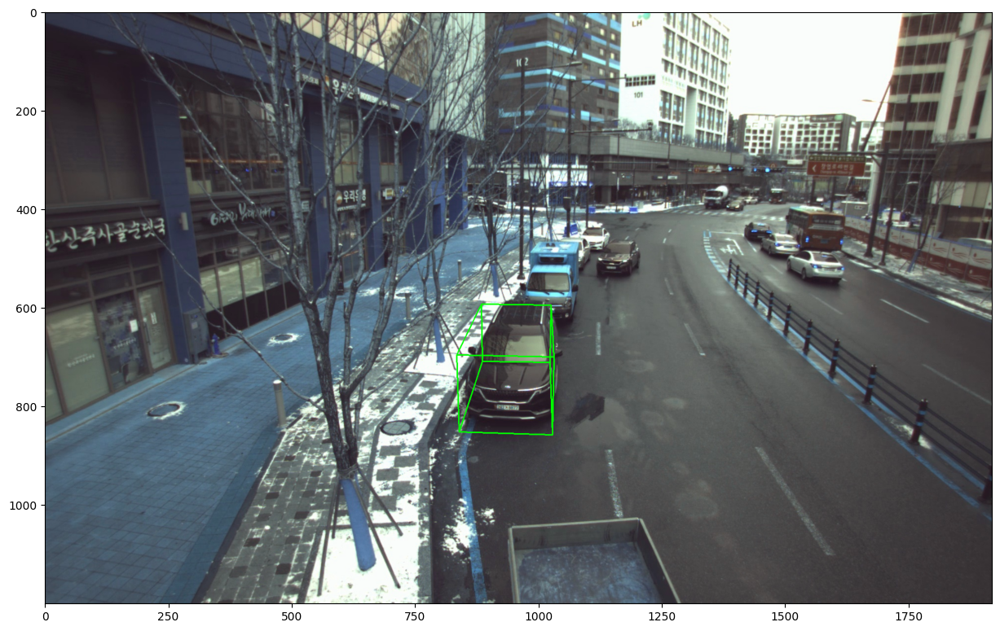

In [3]:
import json

scene = 'Pangyo_D_2212061041_0009'
label_num = 0

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
w = lwh['y']
h = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [0]).T)[:3]

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]


x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [ ]:
def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
w = lwh['y']
h = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [0]).T)[:3]

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]


x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)


In [3]:
import pickle as pkl

with open('/data/NIA50/50-2/models/OpenPCD/output/nia50_train1st_pvrcnn/result.pkl', 'rb') as p:
    result = pkl.load(p)

result

[{'name': array(['Car', 'Car', 'Two_Wheeler', 'Adult', 'Car', 'Car', 'Car', 'Car',
         'Car', 'Car', 'Car', 'Kid', 'Car', 'Adult', 'Car', 'Van', 'Car',
         'Adult', 'Adult'], dtype='<U11'),
  'score': array([0.62369657, 0.5649651 , 0.4940761 , 0.49321625, 0.4084769 ,
         0.39727926, 0.3633725 , 0.32965025, 0.32792076, 0.25041753,
         0.24515861, 0.21600254, 0.17151457, 0.15213662, 0.15035279,
         0.14047217, 0.13777195, 0.1142356 , 0.10321653], dtype=float32),
  'boxes_lidar': array([[ 22.088873  ,   6.6894274 , -12.605721  ,   3.9606273 ,
            1.648592  ,   1.37899   ,   4.045456  ],
         [ 30.606922  ,  18.151434  , -13.159989  ,   4.060978  ,
            1.7086368 ,   1.3965247 ,   4.2575893 ],
         [ 28.029562  ,   6.0629325 , -12.470394  ,   2.1358733 ,
            0.6802949 ,   1.3379245 ,   4.054252  ],
         [ 26.658358  ,  -9.155345  , -11.031453  ,   0.39282048,
            0.4528476 ,   1.1589268 ,   6.9679017 ],
         [ 18.43231

In [7]:
result

[{'name': array(['Car', 'SUV', 'Car', 'Car', 'SUV', 'Car', 'Car', 'Car', 'Car',
         'Car', 'SUV', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car', 'Car',
         'Car', 'Car', 'Car', 'Car', 'Car', 'Van', 'Van', 'Two_Wheeler',
         'Car', 'Car', 'SUV', 'Car', 'Car'], dtype='<U11'),
  'score': array([0.9224252 , 0.9208503 , 0.88613635, 0.8406092 , 0.83045906,
         0.82789326, 0.8071407 , 0.79942054, 0.7979881 , 0.79437387,
         0.7842793 , 0.7596132 , 0.7425584 , 0.51301265, 0.46135914,
         0.44972798, 0.37320885, 0.33874625, 0.2872922 , 0.27823105,
         0.24785598, 0.2127166 , 0.18195842, 0.16552922, 0.16504821,
         0.15346214, 0.14013998, 0.13009101, 0.1234829 , 0.11827511,
         0.10067409], dtype=float32),
  'boxes_lidar': array([[ 13.448188  ,  -8.733852  , -12.253676  ,   5.1738114 ,
            1.8534608 ,   1.5854692 ,   3.215371  ],
         [ 13.472882  ,   6.550472  , -12.082069  ,   4.928451  ,
            1.7445753 ,   1.7574642 ,   3.1766722 ],
 

In [ ]:
import json

# scene = 'Pangyo_D_2212061041_0009'
# label_num = 0

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
w = lwh['y']
h = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [0]).T)[:3]

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]


x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [12]:
import re
import os
import glob
import shutil

# yolov5, pvrcnn inference 완료한 데이터

with open('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/ImageSets/val.txt', 'r') as f:
    scenes = [re.sub('\n', '', i)[:-5] for i in f.readlines()]
    scenes = sorted(list(set(scenes)))

source_path = '/data/NIA50/50-2/data/NIA50/train_1st/raw/'
save_path = '/data/NIA50/50-2/data/NIA50/train_1st/deepfusionmot/'

In [13]:
save_image = save_path + '/image_02/'
os.makedirs(save_path, exist_ok=True)

for scene in scenes:
    img_src = source_path+scene+'/camera/camera_0'
    shutil.copytree(img_src, save_image+scene, dirs_exist_ok=True)

In [10]:
np.concatenate([xyz, [l], [w], [h]])

array([-2.93859823e-03, -2.24319906e+01,  6.67294737e+00,  4.45775799e+00,
        2.10003750e+00,  1.78645515e+00])

In [44]:
import pandas as pd

save_3d_label = save_path + '/3D_pvrcnn/'
os.makedirs(save_3d_label, exist_ok=True)

with open('/data/NIA50/50-2/models/OpenPCD/output/nia50_train1st_pvrcnn/result.pkl', 'rb') as f:
    results = pkl.load(f)

label_df = pd.DataFrame(columns=['frame_id', 'type', 'x1', 'y1', 'x2', 'y2', 'score', 'h', 'w', 'l', 'x', 'y', 'z', 'rot_y'])
# label_df = pd.DataFrame()
for result in results:
    frame_df = pd.DataFrame(columns=['frame_id', 'type', 'x1', 'y1', 'x2', 'y2', 'score', 'h', 'w', 'l', 'x', 'y', 'z', 'rot_y'])
    frame_df['type'] = result['pred_labels']
    frame_df['score'] = result['score']
    frame_df['h'] = result['boxes_lidar'][:, 5]
    frame_df['w'] = result['boxes_lidar'][:, 4]
    frame_df['l'] = result['boxes_lidar'][:, 3]
    frame_df['x'] = result['boxes_lidar'][:, 1]
    frame_df['y'] = result['boxes_lidar'][:, 0] * -1
    frame_df['z'] = result['boxes_lidar'][:, 2]
    frame_df['rot_y'] = result['boxes_lidar'][:, 6]
    frame_df['frame_id'] = result['frame_id']

    # label_df = pd.concat([label_df, frame_df])
    label_df = label_df.append(frame_df)

label_df['scene'] = label_df['frame_id'].apply(lambda x: x[:-5])
label_df['frame'] = label_df['frame_id'].apply(lambda x: int(x[-4:]))

label_df

/tmp/ipykernel_48657/3309645694.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(frame_df)
/tmp/ipykernel_48657/3309645694.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(frame_df)
/tmp/ipykernel_48657/3309645694.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(frame_df)
/tmp/ipykernel_48657/3309645694.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  label_df = label_df.append(frame_df)
/tmp/ipykernel_48657/3309645694.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.

KeyboardInterrupt: 

In [24]:
with open('/data/NIA50/50-2/models/OpenPCD/output/nia50_train1st_pvrcnn/result.pkl', 'rb') as f:
    results = pkl.load(f)
results

[{'name': array(['Car', 'Car', 'Two_Wheeler', 'Adult', 'Car', 'Car', 'Car', 'Car',
         'Car', 'Car', 'Car', 'Kid', 'Car', 'Adult', 'Car', 'Van', 'Car',
         'Adult', 'Adult'], dtype='<U11'),
  'score': array([0.62369657, 0.5649651 , 0.4940761 , 0.49321625, 0.4084769 ,
         0.39727926, 0.3633725 , 0.32965025, 0.32792076, 0.25041753,
         0.24515861, 0.21600254, 0.17151457, 0.15213662, 0.15035279,
         0.14047217, 0.13777195, 0.1142356 , 0.10321653], dtype=float32),
  'boxes_lidar': array([[ 22.088873  ,   6.6894274 , -12.605721  ,   3.9606273 ,
            1.648592  ,   1.37899   ,   4.045456  ],
         [ 30.606922  ,  18.151434  , -13.159989  ,   4.060978  ,
            1.7086368 ,   1.3965247 ,   4.2575893 ],
         [ 28.029562  ,   6.0629325 , -12.470394  ,   2.1358733 ,
            0.6802949 ,   1.3379245 ,   4.054252  ],
         [ 26.658358  ,  -9.155345  , -11.031453  ,   0.39282048,
            0.4528476 ,   1.1589268 ,   6.9679017 ],
         [ 18.43231

In [14]:
%cd /data/NIA50/kimgh/doker/yolov5

!python yolov5.py --train

/data/NIA50/kimgh/doker/yolov5
True


In [6]:
%pwd

'/data/NIA50'

In [8]:
%cd /data/NIA50/kimgh/code

/data/NIA50/kimgh/code


In [9]:
%cd ../

/data/NIA50/kimgh


In [14]:
import re

with open('/data/NIA50/kimgh/doker/yolov5/data/ImageSets/val.txt', 'r') as f:
    vals = f.readlines()


new_vals = []
for val in vals:
    new_val = 'images/'+re.findall('[a-zA-Z0-9_]+', val)[-2]+'.jpg'
    new_vals.append(new_val)
new_vals[0]

'images/Suwon_A_2210261635_0163_0006.jpg'

In [15]:
with open('/data/NIA50/kimgh/doker/yolov5/data/ImageSets/val2.txt', 'w') as f:
    f.write('\n'.join(new_vals))

In [17]:
import os

os.getcwd()

'/data/NIA50/kimgh'